<h1 align = 'center'>TEAM ID:  PTID-CDS-JAN-24-1772 </h1>
<h1 align= 'center'>PROJECT ID: PRCP-1015-EquakeDamagePred  </h1>


## **BUSINESS CASE:**
### **OVERVIEW:**
#### **Richter's Predictor: Modeling Earthquake Damage** 
<p align = 'justify'>

- Based on aspects of building location and construction, your goal is to predict the level of damage to buildings caused by the 2015 Gorkha earthquake in Nepal.

- The data was collected through surveys by Kathmandu Living Labs and the Central Bureau of Statistics, which works under the National Planning Commission Secretariat of Nepal. This survey is one of the largest post-disaster datasets ever collected, containing valuable information on earthquake impacts, household conditions, and socio-economic-demographic statistics.</P>

#### **Problem description**
<p align = 'jusitfy'>

We are trying to predict the ordinal variable damage_grade, which represents a level of damage to the building that was hit by the earthquake. There are 3 grades of the damage:
- 1 represents low damage 
- 2 represents a medium amount of damage 
- 3 represents almost complete destruction 


#### **PROBLEM STATEMENT**

Task 1:-Prepare a complete data analysis report on the given data.

Task 2:-Create a predictive model in such a way that the objective is to predict the ordinal variable “damage_grade”. This column presents the level of damage grade affected by the earthquake.

Task 3:- Suggestions to the Seismologists to avoid  earthquake event leading  to significant damage in many buildings

## **IMPORTING BASIC LIBRARIES:**

In [1]:
import numpy as np
import pandas as pd 
import matplotlib.pyplot as plt
import seaborn as sns
import warnings 
warnings.filterwarnings("ignore")

## **IMPORTING THE DATASET:**

In [2]:
pd.set_option('display.max_columns', None)
train_values= pd.read_csv('train_values.csv')
train_labels= pd.read_csv('train_labels.csv')


In [3]:
train_labels.head()

,building_id,damage_grade
0,802906,3
1,28830,2
2,94947,3
3,590882,2
4,201944,3


In [4]:
train_values.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0


In [5]:
(train_values['building_id']== train_labels['building_id']).nunique()

1

In [6]:
# Since both the dataframes have the same building id column, 
# adding only the target variable'damage_grade'column to the rest of the data (main dataframe).

train_values['damage_grade']= train_labels['damage_grade']
data= train_values
data

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
260596,688636,25,1335,1621,1,55,6,3,n,r,n,f,j,s,q,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260597,669485,17,715,2060,2,0,6,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260598,602512,17,51,8163,3,55,6,7,t,r,q,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260599,151409,26,39,1851,2,10,14,6,t,r,x,v,s,j,d,0,0,0,0,0,1,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2


## **DOMAIN ANALYSIS:**

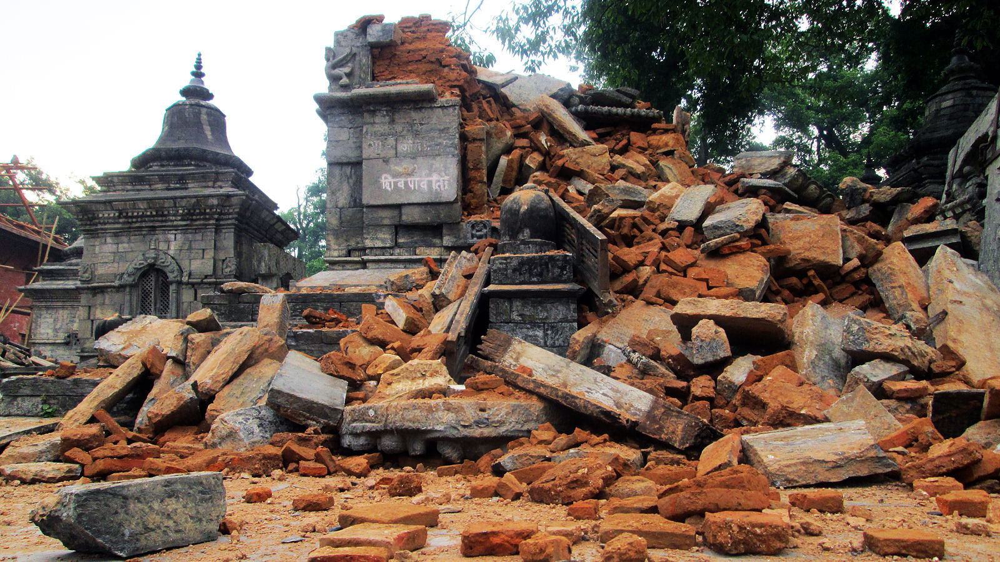

- The dataset mainly consists of information on the buildings' structure and their legal ownership. Each row in the dataset represents a specific building in the region that was hit by Gorkha earthquake(2015).

- There are **39 columns** in this dataset **('train_values' dataset)**, where the **building_id column is a unique and random identifier**. The target variable is the **"damage_grade" ("train_labels" dataset)**. The remaining 38 features are described in the section below. Categorical variables have been obfuscated random lowercase ascii characters. The appearance of the same character in distinct columns does not imply the same original value.

**DESCRIPTION OF FEATURES:**

**1) building_id:**
<dd> -a unique and random identifier for each of the buildings</dd>

**2) geo_level_1_id, 3) geo_level_2_id, 4) geo_level_3_id (type: int):**
<dd> -geographic region in which building exists, from largest (level 1) to most specific sub-region (level 3). Possible values: level 1: 0-30, level 2: 0-1427, level 3: 0-12567.</dd>

**5) count_floors_pre_eq (type: int):**
<dd> -number of floors in the building before the earthquake.</dd>

**6) age (type: int):**
<dd> -age of the building in years.</dd>

**7) area_percentage (type: int):** 
<dd> -normalized area of the building footprint.</dd>

**8) height_percentage (type: int):**
<dd> -normalized height of the building footprint.</dd>

**9) land_surface_condition (type: categorical):** 
- surface condition of the land where the building was built. Possible values: n, o, t.

- Understanding the surface condition of the land where a building is built is crucial for assessing its vulnerability to various natural hazards, such as earthquakes, landslides, and flooding. 

- Buildings constructed on **different types of terrain** may require **different design considerations and structural reinforcements** to ensure their resilience and safety. Therefore, this variable provides valuable information for assessing the risk and potential damage associated with buildings in the dataset.

**10) foundation_type (type: categorical):**
- type of foundation used while building. Possible values: h, i, r, u, w.

- The type of foundation plays a crucial role in assessing a building's resilience to seismic activity and hence helps in assessing the earthquake vulnerability of buildings.

**11) roof_type (type: categorical):**
<dd> -type of roof used while building. Possible values: n, q, x.</dd>

**12) ground_floor_type (type: categorical):**
<dd> -type of the ground floor. Possible values: f, m, v, x, z.</dd>

**13) other_floor_type (type: categorical):**
<dd> -type of constructions used in higher than the ground floors (except of roof). Possible values: j, q, s, x.</dd>

**14) position (type: categorical):**
<dd> -position of the building. Possible values: j, o, s, t.</dd>

**15) plan_configuration (type: categorical):** 
<dd> -building plan configuration. Possible values: a, c, d, f, m, n, o, q, s, u.</dd>

**16) has_superstructure_adobe_mud (type: binary):** 
<dd> -flag variable that indicates if the superstructure was made of Adobe/Mud.</dd>

**17) has_superstructure_mud_mortar_stone (type: binary):**
<dd> -flag variable that indicates if the superstructure was made of Mud Mortar - Stone.</dd>

**18) has_superstructure_stone_flag (type: binary):**
<dd> -flag variable that indicates if the superstructure was made of Stone.</dd>

**19) has_superstructure_cement_mortar_stone (type: binary):**
<dd> -flag variable that indicates if the superstructure was made of Cement Mortar - Stone.</dd>

**20) has_superstructure_mud_mortar_brick (type: binary):** 
<dd> -flag variable that indicates if the superstructure was made of Mud Mortar - Brick.</dd>

**21) has_superstructure_cement_mortar_brick (type: binary):**
<dd> -flag variable that indicates if the superstructure was made of Cement Mortar - Brick.</dd>

**22) has_superstructure_timber (type: binary):** 
<dd>flag variable that indicates if the superstructure was made of Timber.</dd>

**23) has_superstructure_bamboo (type: binary):**
<dd> -flag variable that indicates if the superstructure was made of Bamboo.</dd>

**24) has_superstructure_rc_non_engineered (type: binary):** 
<dd> -flag variable that indicates if the superstructure was made of non-engineered reinforced concrete.</dd>

**25) has_superstructure_rc_engineered (type: binary):**
<dd> -flag variable that indicates if the superstructure was made of engineered reinforced concrete.</dd>

**26) has_superstructure_other (type: binary):** 
<dd>flag variable that indicates if the superstructure was made of any other material.</dd>

**27) legal_ownership_status (type: categorical):**
<dd> -legal ownership status of the land where building was built. Possible values: a, r, v, w.</dd>

**28) count_families (type: int):**
<dd> -number of families that live in the building.</dd>

**29) has_secondary_use (type: binary):** 
<dd> -flag variable that indicates if the building was used for any secondary purpose.</dd>

**30) has_secondary_use_agriculture (type: binary):** 
<dd> -flag variable that indicates if the building was used for agricultural purposes.</dd>

**31) has_secondary_use_hotel (type: binary):**
<dd> -flag variable that indicates if the building was used as a hotel.</dd>

**32) has_secondary_use_rental (type: binary):** 
<dd> -flag variable that indicates if the building was used for rental purposes.</dd>

**33) has_secondary_use_institution (type: binary):**
<dd> -flag variable that indicates if the building was used as a location of any institution.</dd>

**34) has_secondary_use_school (type: binary):** 
<dd> -flag variable that indicates if the building was used as a school.</dd>

**35) has_secondary_use_industry (type:binary):** 
<dd> -flag variable that indicates if the building was used for industrial purposes.</dd>

**36) has_secondary_use_health_post (type: binary):** 
<dd> -flag variable that indicates if the building was used as a health post.</dd>

**37) has_secondary_use_gov_office (type: binary):**
<dd> -flag variable that indicates if the building was used fas a government office.</dd>

**38) has_secondary_use_use_police (type: binary):** 
<dd> -flag variable that indicates if the building was used as a police station.</dd>

**39) has_secondary_use_other (type: binary):**
<dd> -flag variable that indicates if the building was secondarily used for other purposes.</dd>

**TARGET VARIABLE**:

**damage_grade:** is a ordinal variable, representing a level of damage to the building that was hit by the earthquake.

There are 3 grades of the damage:
<ul>
<li>1--> represents low damage 
<li>2--> represents a medium amount of damage 
<li>3--> represents almost complete destruction </li></ul>



## **BASIC CHECKS:**

In [7]:
# viewing dimension of the data

x= data.shape
print(x)
print(f'rows: {x[0]}\ncolumns: {x[1]}')

(260601, 40)
rows: 260601
columns: 40


In [8]:
# first five rows

data.head()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,802906,6,487,12198,2,30,6,5,t,r,n,f,q,t,d,1,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
1,28830,8,900,2812,2,10,8,7,o,r,n,x,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
2,94947,21,363,8973,2,10,5,5,t,r,n,f,x,t,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
3,590882,22,418,10694,2,10,6,5,t,r,n,f,x,s,d,0,1,0,0,0,0,1,1,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
4,201944,11,131,1488,3,30,8,9,t,r,n,f,x,s,d,1,0,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3


In [9]:
# last five records

data.tail()

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
260596,688636,25,1335,1621,1,55,6,3,n,r,n,f,j,s,q,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260597,669485,17,715,2060,2,0,6,5,t,r,n,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260598,602512,17,51,8163,3,55,6,7,t,r,q,f,q,s,d,0,1,0,0,0,0,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,3
260599,151409,26,39,1851,2,10,14,6,t,r,x,v,s,j,d,0,0,0,0,0,1,0,0,0,0,0,v,1,0,0,0,0,0,0,0,0,0,0,0,2
260600,747594,21,9,9101,3,10,7,6,n,r,n,f,q,j,d,0,1,0,0,0,0,0,0,0,0,0,v,3,0,0,0,0,0,0,0,0,0,0,0,3


In [10]:
# column names

data.columns

Index(['building_id', 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage',
       'land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 'has_superstructure_adobe_mud',
       'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag',
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other',
       'legal_ownership_status', 'count_families', 'has_secondary_use',
       'has_secondary_use_agriculture', 'has_secondary_use_hotel',
       'has_secondary_use_rental', 'has_secondary_use_institution',
       'has_secondary_use_school', 'has_secondary_use_i

In [11]:
# showing datatypes

data.dtypes

building_id                                int64
geo_level_1_id                             int64
geo_level_2_id                             int64
geo_level_3_id                             int64
count_floors_pre_eq                        int64
age                                        int64
area_percentage                            int64
height_percentage                          int64
land_surface_condition                    object
foundation_type                           object
roof_type                                 object
ground_floor_type                         object
other_floor_type                          object
position                                  object
plan_configuration                        object
has_superstructure_adobe_mud               int64
has_superstructure_mud_mortar_stone        int64
has_superstructure_stone_flag              int64
has_superstructure_cement_mortar_stone     int64
has_superstructure_mud_mortar_brick        int64
has_superstructure_c

#### Insights:
- Most of the columns belong to the **int64** datatype.
- land_surface_condition, foundation_type, roof_type, ground_floor_type, other_floor_type, position, plan_configuration and legal_ownership_status are the features of **object type**.
- Hence 8 features are of string type and the remaining features are of int64 datatype.

In [12]:
# Basic information about the features

data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 260601 entries, 0 to 260600
Data columns (total 40 columns):
 #   Column                                  Non-Null Count   Dtype 
---  ------                                  --------------   ----- 
 0   building_id                             260601 non-null  int64 
 1   geo_level_1_id                          260601 non-null  int64 
 2   geo_level_2_id                          260601 non-null  int64 
 3   geo_level_3_id                          260601 non-null  int64 
 4   count_floors_pre_eq                     260601 non-null  int64 
 5   age                                     260601 non-null  int64 
 6   area_percentage                         260601 non-null  int64 
 7   height_percentage                       260601 non-null  int64 
 8   land_surface_condition                  260601 non-null  object
 9   foundation_type                         260601 non-null  object
 10  roof_type                               260601 non-null 

In [13]:
# Insights:
# There are no null values in this dataset.

In [323]:
# Statistical information (for numerical features)

data.describe().T.sort_values('std', ascending = False)\
.style.background_gradient(cmap='cividis_r')

,count,mean,std,min,25%,50%,75%,max
building_id,260601.000000,525675.482773,304544.999032,4.000000,261190.000000,525757.000000,789762.000000,1052934.000000
geo_level_3_id,260601.000000,6257.876148,3646.369645,0.000000,3073.000000,6270.000000,9412.000000,12567.000000
geo_level_2_id,260601.000000,701.074685,412.710734,0.000000,350.000000,702.000000,1050.000000,1427.000000
age,260601.000000,26.535029,73.565937,0.000000,10.000000,15.000000,30.000000,995.000000
geo_level_1_id,260601.000000,13.900353,8.033617,0.000000,7.000000,12.000000,21.000000,30.000000
area_percentage,260601.000000,8.018051,4.392231,1.000000,5.000000,7.000000,9.000000,100.000000
height_percentage,260601.000000,5.434365,1.918418,2.000000,4.000000,5.000000,6.000000,32.000000
count_floors_pre_eq,260601.000000,2.129723,0.727665,1.000000,2.000000,2.000000,2.000000,9.000000
damage_grade,260601.000000,2.238272,0.611814,1.000000,2.000000,2.000000,3.000000,3.000000
has_superstructure_timber,260601.000000,0.254988,0.435855,0.000000,0.000000,0.000000,1.000000,1.000000


#### Insights:

The above table of summary statistics for various features related to building characteristics and damage grade can be categorized as follows:

##### **BUILDING CHARACTERISTICS**
- **Building ID**:
   - This is a unique feature hence contributes very less to the prediction.

- **Geo Level 3 ID, 2 ID, and 1 ID**: 
   - These columns represent geographic identifiers at different levels. They have means around 6258, 701, and 14 respectively, indicating that there are multiple buildings from various geographic regions represented in the dataset from largest (level 1) to most specific sub-region (level 3).

- **Age**: 
   - The mean age of buildings is approximately 26.54 years, with a high standard deviation of 73.57, suggesting a wide range of building ages in the dataset starting from the range of 0 to 995 years!. But most of them (**around 75%) come under less than 30 years old** buildings type.

- **Area Percentage and Height Percentage**: 
   - These features describe the normalised area and height proportions of the buildings. The **mean area percentage** is around 8.02 with the minimum and the maximum value being 1 and 100 repectively. 
   
   - The **mean height percentage** is approximately 5.43 with the minimum and maximum value being 2 and 32 respectively. But most of the buildings have their area percentage and height percentage in the range of less than 9 and 6 respectively. 

- **Count Floors Pre EQ and Count Families**: 
   - The **average number of floors before the earthquake** is around 2.13 having minimum of 1 floor to the maximum of 9 floors.  However around 75% of them constitute less than two floors.
   - The **average count of families** in the building is approximately 0.98 ranging from 0 to 9 as minimum and maximum value respectively. Most of the count shows one family count in the building.

- **Secondary Use Features**: 
   - These features indicate whether the building has secondary uses like agriculture, hotels, rentals, etc. The means for these features are quite low, indicating that **secondary uses are not very common in the dataset**.

##### **DAMAGE GRADE**
- The mean damage grade is approximately 2.24, with a standard deviation of 0.61. This suggests that the **majority of buildings might have experienced moderate damage (Grade 2)**, given that the mean is closer to 2.

##### **SUPERSTRUCTURE FEATURES**

- Various features represent the presence of different types of superstructures **like timber, mud mortar stone, adobe mud, etc.** The means for these features indicate the proportion of buildings with each type of superstructure.

##### SUMMARY

- The dataset contains information about a significant number of buildings with diverse characteristics.
- The wide range of building ages suggests that buildings of different ages are represented in the dataset, which could be a significant factor in assessing earthquake damage.
- Most buildings seem to have moderate damage (Grade 2), but further analysis would be needed to understand the factors contributing to damage grade.
- Features related to secondary use and superstructure composition provide additional insights into the dataset's characteristics.


In [15]:
# statistical information (for categorical features)

data.describe(include='O').T

,count,unique,top,freq
land_surface_condition,260601,3,t,216757
foundation_type,260601,5,r,219196
roof_type,260601,3,n,182842
ground_floor_type,260601,5,f,209619
other_floor_type,260601,4,q,165282
position,260601,4,s,202090
plan_configuration,260601,10,d,250072
legal_ownership_status,260601,4,v,250939


#### Insights:
- **Land Surface Condition:**
   - There are three unique categories representing different land surface conditions.
   - The most **frequent condition is 't'**, with a frequency of 216,757.

- **foundation_type**:
  - There are five unique categories representing different types of foundations.
  - The most common foundation type is **'r'**, with a frequency of 219,196.

- **Roof_type**:
  - There are three unique categories representing different types of roofs.
  - The most common roof type is **'n'**, with a frequency of 182,842.

- **Ground Floor Type:**
  - There are five unique categories representing different types of ground floors.
  - The most frequent ground floor type is **'f'**, with a frequency of 209,619.

- **Other Floor Type:**
  - There are four unique categories representing different types of other floors.
  - The most common other floor type is **'q'**, with a frequency of 165,282.

- **Position:**
  - There are four unique categories representing different positions of the building.
  - The most frequent position is **'s'**, with a frequency of 202,090.

- **Plan Configuration:**
  - There are ten unique categories representing different plan configurations.
  - The most common plan configuration is **'d'**, with a frequency of 250,072.

- **Legal Ownership Status:**
  - There are four unique categories representing different legal ownership statuses.
  - The most frequent legal ownership status is **'v'**, with a frequency of 250,939.


In [308]:
# no of unique elements in each of the column

data.nunique().to_frame().T.style.background_gradient(cmap='cividis_r')

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade
0,260601,31,1414,11595,9,42,84,27,3,5,3,5,4,4,10,2,2,2,2,2,2,2,2,2,2,2,4,10,2,2,2,2,2,2,2,2,2,2,2,3


#### Insights:
Based on the count of unique values in all the features, it is clear as such follows:
- **numerical features**

  - **continuous features**: "buiding_id", "geo_level_1_id", "geo_level_2_id", "geo_level_3_id", "age", "area_percentage", "height_percentage"

  - **discrete features**: "count_floors_pre_eq", "count_families", "damage_grade"

  
- **categorical features**

  - **binary_features**: "has_secondary_use", "has_secondary_use_agriculture", "has_secondary_use_hotel", "has_secondary_use_rental", 
                         "has_secondary_use_institution","has_secondary_use_school","has_secondary_use_industry", "has_secondary_use_health_post", "has_secondary_use_gov_office", "has_secondary_use_use_police",
                         "has_secondary_use_other",
                         "has_superstructure_adobe_mud",  "has_superstructure_mud_mortar_stone", "has_superstructure_stone_flag", 
                         "has_superstructure_cement_mortar_stone", "has_superstructure_mud_mortar_brick", "has_superstructure_cement_mortar_brick", "has_superstructure_timber", "has_superstructure_bamboo", 
                         "has_superstructure_rc_non_engineered", "has_superstructure_rc_engineered", "has_superstructure_other"

  - **ordinal/ nominal features**:"land_surface_condition", "foundation_type", "roof_type", "ground_floor_type", "other_floor_type", "position", "plan_configuration", "legal_ownership_status"	


In [9]:
# Unique categories of all the categorical features
categorical_features = ['land_surface_condition', 'foundation_type', 'roof_type', 'ground_floor_type', 'other_floor_type', 'position', 'plan_configuration', 'legal_ownership_status']

for column in categorical_features:
    value_counts= data[column].value_counts(normalize=True).reset_index()
    value_counts.columns = [column.upper(), 'value_counts']

    # Using Seaborn color palette to add color to the DataFrame
    styled_df = value_counts.style.background_gradient(cmap='cividis_r')

    # Displaying the styled DataFrame with colored background
    display(styled_df)
    print("\n")


,LAND_SURFACE_CONDITION,value_counts
0,t,0.831758
1,n,0.136331
2,o,0.031911


,FOUNDATION_TYPE,value_counts
0,r,0.841117
1,w,0.058012
2,u,0.054720
3,i,0.040595
4,h,0.005556


,ROOF_TYPE,value_counts
0,n,0.701617
1,q,0.236285
2,x,0.062099


,GROUND_FLOOR_TYPE,value_counts
0,f,0.804368
1,x,0.095460
2,v,0.094370
3,z,0.003853
4,m,0.001949


,OTHER_FLOOR_TYPE,value_counts
0,q,0.634234
1,x,0.166722
2,j,0.152889
3,s,0.046155


,POSITION,value_counts
0,s,0.775477
1,t,0.164604
2,j,0.050967
3,o,0.008952


,PLAN_CONFIGURATION,value_counts
0,d,0.959597
1,q,0.021842
2,u,0.014002
3,s,0.001328
4,c,0.001247
5,a,0.000967
6,o,0.000610
7,m,0.000177
8,n,0.000146
9,f,0.000084


,LEGAL_OWNERSHIP_STATUS,value_counts
0,v,0.962924
1,a,0.021151
2,w,0.010272
3,r,0.005652


#### Insights:
- Around **83%** constitutes **'t'** type of **land surface condition** and the least percentage is 'o' type.

- **r** type of **foundation** dominates around **84%** of the buildings in the dataset and the least category is 'h'.

- In  **roof_type feature**, **'n'** type occupies the dominant position of around **70%** followed by 'q' type of around 23%.

- Around **80%** constitutes **'f'** type of **ground_floor** and the least percentage is 'm' type.

- **q** type of **other_floor_type** dominates around **63%** of the buildings in the dataset and the least category is 's'.

- In  **position feature**, **'s'** type occupies the dominant position of around **77%** followed by 't' type of around 16%.

- In **plan_configuration**, **'d** dominates 95% of the damaged buildings.

- Around **96%** of the buildings belong to the **v** type of **legal_ownership_status**.


## **EXPLORATORY DATA ANALYSIS:**

### **UNIVARIATE ANALYSIS:**

#### **INDEPENDENT FEATURES**
#### Distribution of Categorical/ discrete and numerical features:

In [18]:
# fetching all the columns in the dataset

data.columns

Index(['building_id', 'geo_level_1_id', 'geo_level_2_id', 'geo_level_3_id',
       'count_floors_pre_eq', 'age', 'area_percentage', 'height_percentage',
       'land_surface_condition', 'foundation_type', 'roof_type',
       'ground_floor_type', 'other_floor_type', 'position',
       'plan_configuration', 'has_superstructure_adobe_mud',
       'has_superstructure_mud_mortar_stone', 'has_superstructure_stone_flag',
       'has_superstructure_cement_mortar_stone',
       'has_superstructure_mud_mortar_brick',
       'has_superstructure_cement_mortar_brick', 'has_superstructure_timber',
       'has_superstructure_bamboo', 'has_superstructure_rc_non_engineered',
       'has_superstructure_rc_engineered', 'has_superstructure_other',
       'legal_ownership_status', 'count_families', 'has_secondary_use',
       'has_secondary_use_agriculture', 'has_secondary_use_hotel',
       'has_secondary_use_rental', 'has_secondary_use_institution',
       'has_secondary_use_school', 'has_secondary_use_i

In [7]:
target= 'damage_grade'
independent_features= [column for column in data.drop(target, axis=1)]

# As per the basic checks analysis,
# categorical features (ordinal/ nominal/ binary)
binary_features= ["has_secondary_use", "has_secondary_use_agriculture", "has_secondary_use_hotel", "has_secondary_use_rental",
                         "has_secondary_use_institution","has_secondary_use_school","has_secondary_use_industry", "has_secondary_use_health_post", 
                         "has_secondary_use_gov_office", "has_secondary_use_use_police", "has_secondary_use_other",
                         "has_superstructure_adobe_mud",  "has_superstructure_mud_mortar_stone", "has_superstructure_stone_flag", 
                         "has_superstructure_cement_mortar_stone", "has_superstructure_mud_mortar_brick", "has_superstructure_cement_mortar_brick", 
                         "has_superstructure_timber", "has_superstructure_bamboo", "has_superstructure_rc_non_engineered",
                         "has_superstructure_rc_engineered", "has_superstructure_other"]

other_cat_features= ["land_surface_condition", "foundation_type", "roof_type", "ground_floor_type", 
                     "other_floor_type", "position", "plan_configuration", "legal_ownership_status"]

discrete_features= ["count_floors_pre_eq", "count_families"]
# discrete features are also added to categorical features for visualization purpose
categorical_columns= binary_features + other_cat_features + discrete_features

# continuous features
continuous_columns= ["building_id", "geo_level_1_id", "geo_level_2_id", "geo_level_3_id", "age", "area_percentage", "height_percentage"]

# displaying the distribution of features in the dataset as per the datatype
print(f'Target variable: {target}\nTotal no of independent features (except target): {len(independent_features)}')
print(f'No of categorical features: {len(categorical_columns)}')
print(f'No of continuous features: {len(continuous_columns)}')

Target variable: damage_grade
Total no of independent features (except target): 39
No of categorical features: 32
No of continuous features: 7


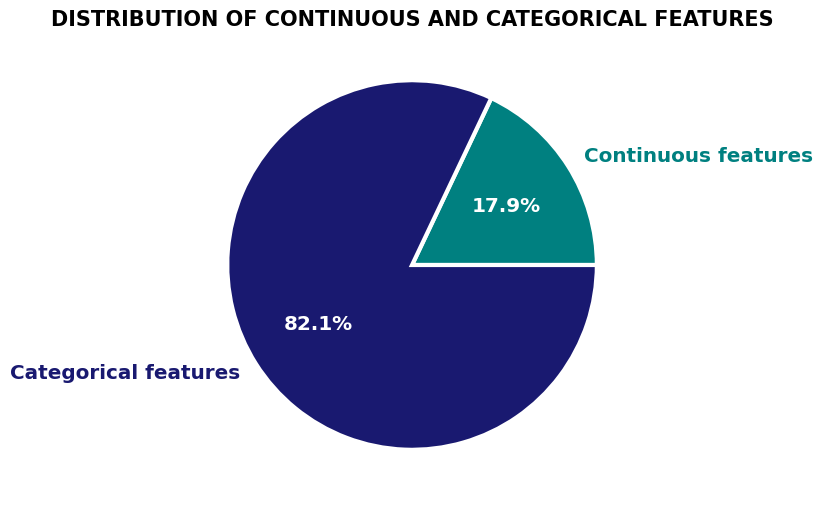

In [125]:
# pie chart showing the distribution of independent features
fig, ax= plt.subplots(figsize= (8, 6))
patches, texts, pcts= ax.pie(
                              [len(continuous_columns), len(categorical_columns)], labels= ['Continuous features', 'Categorical features'], autopct= '%.1f%%', 
                               colors= ['teal','midnightblue'],
                               textprops= {'size': 'x-large'},
                               wedgeprops= {'linewidth': 3, 'edgecolor': 'white'},
                              )

# styling the percent values
plt.setp(pcts, fontweight= 'bold', color= 'white')
plt.setp(texts, fontweight= 600)

# for each wedge, styling the corresponding text label color---> to the wedge's face color
for i, patch in enumerate(patches):
    texts[i].set_color(patch.get_facecolor())

plt.title('DISTRIBUTION OF CONTINUOUS AND CATEGORICAL FEATURES', fontsize= 15, fontweight = 'bold')
plt.show()

#### **TARGET VARIABLE**

In [9]:
value_counts_target= data['damage_grade'].value_counts()
value_counts_target
# 1- Low damage
# 2- medium amount of damage
# 3- almost complete destruction

damage_grade
2    148259
3     87218
1     25124
Name: count, dtype: int64

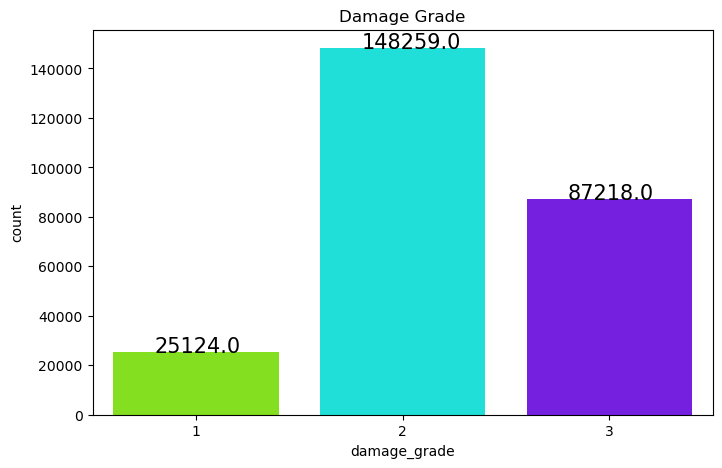

In [80]:
# visualizing each class of the target variable and their proportions

plt.figure(figsize=(8,5))
ax=sns.countplot(data= data, x= "damage_grade", palette= 'hsv')

# iterating over each bar of the countplot created
for i in ax.patches:

    # get_x pulls the text left or right; 
    # get_height pushes the text up or down
    ax.text(i.get_x() + 0.2, i.get_height() +0.5,\
            str(round(i.get_height(), 2)), fontsize=15)
plt.title("Damage Grade")
plt.show()  


##### Insights:
- 1--> low damage,
- 2--> medium damage,
- 3--> high damage
- Clearly medium-damaged buildings are highly represented in the dataset followed by high-damaged buildings.


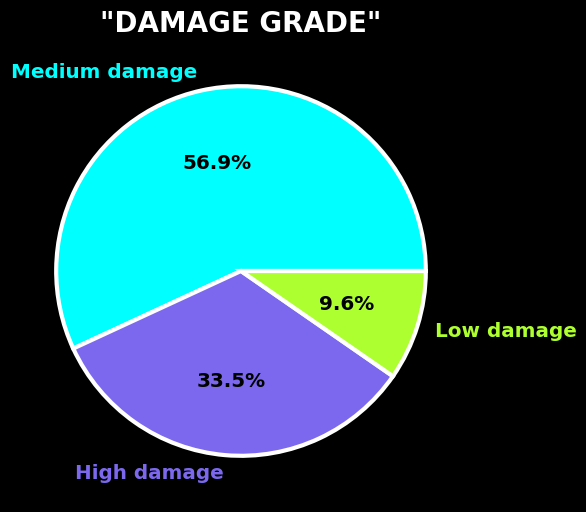

In [153]:
# defining labels and colors
labels= [f'{"Medium damage" if i==0 else "High damage" if i ==1 else "Low damage"}'
         for i in range(len(value_counts_target))]

colors= ['aqua', 'mediumslateblue', 'greenyellow']

# creating piechart by plotting the percentage values of each classes
fig, ax= plt.subplots(figsize= (8, 6), facecolor= 'black')

# three return values from pie.---> The wedge patches, the label texts, the percentage texts
# to style them
wedges, texts, pcts= ax.pie(
                             value_counts_target.values, labels= labels, autopct= '%.1f%%',
                             colors= colors,
                             wedgeprops= {'linewidth': 3, 'edgecolor': 'white'},
                             textprops= {'size': 'x-large'}
                             )

# styling the percent values
plt.setp(pcts, fontweight= 'bold')
plt.setp(texts, fontweight= 600)

# for each wedge, styling the corresponding text label color---> to the wedge's face color
for i, wedge in enumerate(wedges):
    texts[i].set_color(wedge.get_facecolor())

plt.title('"DAMAGE GRADE"', color= 'white', fontweight= 'bold', fontsize= 20)
plt.show()

##### Insights:
- The above piechart shows that the target variable does not have the equal count in all the classes. hence the data is imbalanced.

- **Medium damage** is highly represented (56.9%) compared to the other two classes (low damage- 9.6%, high damage- 33.5%)

#### **EXPLORING CATEGORICAL FEATURES**

In [158]:
len(categorical_columns)

32

In [10]:
categorical_columns

['has_secondary_use',
 'has_secondary_use_agriculture',
 'has_secondary_use_hotel',
 'has_secondary_use_rental',
 'has_secondary_use_institution',
 'has_secondary_use_school',
 'has_secondary_use_industry',
 'has_secondary_use_health_post',
 'has_secondary_use_gov_office',
 'has_secondary_use_use_police',
 'has_secondary_use_other',
 'has_superstructure_adobe_mud',
 'has_superstructure_mud_mortar_stone',
 'has_superstructure_stone_flag',
 'has_superstructure_cement_mortar_stone',
 'has_superstructure_mud_mortar_brick',
 'has_superstructure_cement_mortar_brick',
 'has_superstructure_timber',
 'has_superstructure_bamboo',
 'has_superstructure_rc_non_engineered',
 'has_superstructure_rc_engineered',
 'has_superstructure_other',
 'land_surface_condition',
 'foundation_type',
 'roof_type',
 'ground_floor_type',
 'other_floor_type',
 'position',
 'plan_configuration',
 'legal_ownership_status',
 'count_floors_pre_eq',
 'count_families']

In [11]:
# total no of categorical columns is composed of:
# 1--->binary_features
# 2--->other_cat_features
# 3---> discrete_features

print(f'Total no of categorical columns are as follows⬇️\n\
        binary_features: {len(binary_features)}\n\
        other_cat_features: {len(other_cat_features)}\n\
        discrete_features: {len(discrete_features)}')


Total no of categorical columns are as follows⬇️
        binary_features: 22
        other_cat_features: 8
        discrete_features: 2


##### **i) BINARY FEATURES**

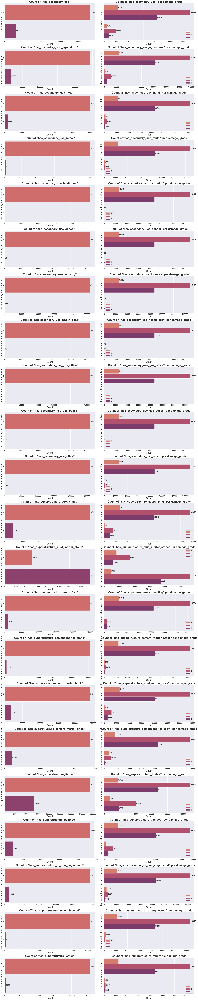

In [326]:
fig, axes = plt.subplots(22,2, figsize=(30,150))
sns.set_style('darkgrid')
plotnumber = 0

for column in binary_features:
  if plotnumber<=22:
    # loop for each subplot
    for i in range(2):
          ax= sns.countplot(data= data, y= column, palette= 'flare',
                            orient= 'h', ax= axes[plotnumber][i],
                            hue= 'damage_grade' if i == 1 else None)
          
          # title, x label, y label
          ax.set_title(f'Count of "{column}"' + (' per damage_grade' if i ==1 else ''), fontsize= 30, fontweight= 'bold')
          ax.set_xlabel('Count', fontsize= 25)
          ax.set_ylabel(column, fontsize= 25)

          # Increasing x-tick size and y-tick size
          for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize(20)
          for tick in ax.yaxis.get_major_ticks():
                tick.label.set_fontsize(20)
          
          # Increasing bar label size
          for container in ax.containers:
                ax.bar_label(container, fontsize= 20)
          
          # Increasing legend size
          if i ==1:
                ax.legend(fontsize= 20)
    plotnumber +=1

plt.subplots_adjust(hspace= 2, wspace= 2)
plt.tight_layout()
plt.show()

##### Insights:
**1. has_secondary_use**
- The buildings without secondary use have the higher frequency than the ones with the secondary usage.
- Around 85% of buildings do not have secondary usage.

  - The **count per damage grade** shows that,
      - Among buildings without secondary usage,
         - the average level of damage grade have the highest frequency.
      - Among the buildings with secondary usage,
         - the average level of damage constitute the majority.
  - Therefore, <b><i>irrespective of having secondary usage</i></b>, almost three-fourth of buildings suffered ***medium damage*** as the highest frequency of damage due to earthquake.

**2. has_secondary_use_agriculture**
- The buildings without secondary purpose of agriculture have the higher frequency of around 94%.

  - The **count per damage grade** shows that here also, the buildings ***regardless of having secondary purpose of agriculture***, suffered ***medium damage*** as the highest frequency in the earthquake.

**3. has_secondary_use_hotel**
- The buildings without secondary purpose of hotel have the higher frequency of around 97%.

  - The **count per damage grade** shows that ***medium damage*** is visible in both of the cases.

**4. has_secondary_use_rental**
- The buildings without secondary purpose of rental have the higher frequency of around 99%.

  - The **count per damage grade** shows that ***medium damage*** is visible in both of the scenarios.

**5. has_secondary_use_institution**
- The buildings without secondary purpose of institution have the higher frequency of around 99.9% and hence almost all the buildings do not serve as institutions as secondary usage. In this category, the ***medium damage*** is seen as the dominating category of damage grade.

**6. has_secondary_use_school**
- The buildings without secondary purpose of school have the higher frequency of around 99.9% and so almost all the buildings do not serve as schools. In this category, the ***medium damage*** is seen as the dominating category of damage grade.

**7. has_secondary_use_industry**
- The buildings without secondary purpose of industry have the higher frequency of around 99.8% and so almost all the buildings do not serve as industries. In this category, the ***medium damage*** is seen as the dominating category of damage grade.

**8. has_secondary_use_health_post**
- The buildings without secondary purpose of health_post have the higher frequency of around 99.9% and so almost all the buildings do not serve the purpose of health post. In this category, the ***medium damage*** is the dominating category of damage grade.

**9. has_secondary_use_gov_office**
- The buildings without secondary purpose of gov_office have the higher frequency of around 99.9% and so almost all the buildings do not serve the purpose of government office. In this category, the ***medium damage*** is the dominating grade of damage.

**10. has_secondary_use_use_police**
- The buildings without secondary purpose of use_police have the higher frequency of around 99.9% and so almost all the buildings are not used by the police. In this category, the ***medium damage*** is the dominating grade of damage.

**11. has_secondary_use_other**
- The buildings without secondary purpose of use_other have the higher frequency of around 99.4% and so almost all the buildings are not used for other secondary purposes not mentioned earlier. In this category, again the ***medium damage*** is the dominating grade of damage.

**12. has_superstructure_adobe_mud**
- The buildings that do not have the superstructure_adobe_mud have the higher frequency of around 91%.

  - The **count per damage grade** shows that,
      - Among buildings without adobe_mud superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority.
  - Therefore, ***medium damage*** is the highest frequency of damage in these buildings.

**13. has_superstructure_mud_mortar_stone**
- The buildings that do not have the superstructure_mud_mortar_stone have the higher frequency of around 76%.

  - The **count per damage grade** shows that,
      - Among buildings without mud mortar stone superstructure,
         - the average level of damage grade have the highest frequency followed by the low level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by high damage.
  - Therefore, ***medium damage*** is the highest frequency of damage in these buildings.  But buildings without mud mortar superstructure has slightly higher advantge of having less damage compared to buildings with mud mortar superstructure.

**14. has_superstructure_stone_flag**
- The buildings that do not have the superstructure_mud_mortar_stone have the higher frequency of around 97%.

  - The **count per damage grade** shows that,
      - Among buildings without stone flag superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by high damage.
  - Therefore, ***medium damage*** is the highest frequency of damage in these buildings.  

**15. has_superstructure_cement_mortar_stone**
- The buildings that do not have the superstructure_cement_mortar_stone have the higher frequency of around 98%.

  - The **count per damage grade** shows that,
      - Among buildings without cement mortar stone superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by low damage.
  - Therefore, ***medium damage*** is the highest frequency of damage in these buildings. However buildings with cement mortar stone have more advantage in withstanding the effects of earthquake.

**16. has_superstructure_mud_mortar_brick**
- The buildings that do not have the superstructure_mud_mortar_brick have the higher frequency of around 93%.

  - The **count per damage grade** shows that,
      - Among buildings without mud_mortar_brick superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by high damage.
  - Therefore, ***medium damage*** is the highest frequency of damage in these buildings. 

**17. has_superstructure_cement_mortar_brick**
- The buildings that do not have the superstructure_cement_mortar_brick have the higher frequency of around 93%.

  - The **count per damage grade** shows that,
      - Among buildings without cement_mortar_brick superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by low damage.
  - Therefore, ***medium damage*** is the highest frequency of damage in these buildings. But cement mortar brick superstructure is advantageous over the buildings without this superstructure in terms of resilience.

**18. has_superstructure_timber**
- The buildings that do not have the superstructure_timber have the higher frequency of around 75%.

  - The **count per damage grade** shows that,
      - Among buildings without timbered superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by high damage.
  - Therefore, ***medium damage*** is the highest frequency of damage irrespective of timber as superstructure in the buildings. 

**19. has_superstructure_bamboo**
- The buildings that do not have the superstructure_bamboo have the higher frequency of around 92%.

  - The **count per damage grade** shows that,
      - Among buildings without bamboo as superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by high damage.
  - Therefore, ***medium damage*** is the highest frequency of damage irrespective of bamboo as superstructure in the buildings. 

**20. has_superstructure_rc_non_engineered**
- The buildings that do not have the superstructure_rc_non_engineered have the higher frequency of around 95%.

  - The **count per damage grade** shows that,
      - Among buildings without rc_non_engineered as superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the average level of damage constitute the majority followed by low damage.
  - Therefore, ***medium damage*** is the highest frequency of damage. But rc_non_engineered superstructured buildings have suffered significantly less damage than the buildings without rc superstructure.

**21. has_superstructure_rc_engineered**
- The buildings that do not have the superstructure_rc_engineered have the higher frequency of around 98%.

  - The **count per damage grade** shows that,
      - Among buildings without rc_engineered as superstructure,
         - the average level of damage grade have the highest frequency followed by the high level of damage.
      - Among the buildings with this type of superstructure,
         - the low level of damage constitute the majority followed by average damage.
  - Hence, buildings with rc_engineered superstructure exhibits good strength against earthquake.

**22. has_superstructure_other**
- The buildings that do not have the superstructure_other have the higher frequency of around 99%.
- They are suffered ***medium damage*** as the highest frequency.

**SUMMARY INSIGHTS**

- Majority of buildings in the dataset do not have secondary usage, with around **85% of buildings** falling into this category.

- Regardless of whether buildings have secondary usage, the most common damage grade observed is medium damage, constituting almost three-fourths of the buildings.

- Among buildings without secondary purpose of agriculture, hotel, rental, institution, school, industry, health post, government office, police, or other secondary uses, medium damage is the predominant damage grade.

- Buildings without certain types of superstructures such as adobe mud, mud mortar stone, stone flag, cement mortar stone, mud mortar brick, cement mortar brick, timber, bamboo, or non-engineered reinforced concrete tend to have higher frequencies of medium damage.

- However, **engineered reinforced concrete superstructures** show resilience against earthquake damage, with buildings having this type of superstructure exhibiting **low to average damage grades**.

- Overall, **medium damage is the most common damage grade** across various building characteristics and superstructure types, indicating the widespread impact of earthquakes on structures regardless of their specific attributes.

##### **An overview of percentages of each unique categories in binary features**:

In [46]:
from IPython.display import HTML

# Unique categories of all the categorical features
# Define an empty list to store HTML tables
html_output = ''

for column in binary_features:
    # Calculate value counts and normalize
    value_counts = (data[column].value_counts(normalize=True) *100).reset_index()
    value_counts.columns = [column.upper(), 'Value_Counts']
    
    # Style DataFrame with background gradient
    styled_df = value_counts.style.format({'Value_Counts': '{:.2f}%'}).background_gradient(cmap='flare')
    
    # Convert styled DataFrame to HTML table
    html_table = styled_df.to_html(escape= False)
    
    # Wrap each HTML table within a <div> tag to display them separately in parallel 
    html_output += f'<div>{html_table}</div>'

# Display concatenated HTML tables
HTML(html_output)

,HAS_SECONDARY_USE,Value_Counts
0,0,88.81%
1,1,11.19%
,HAS_SECONDARY_USE_AGRICULTURE,Value_Counts
0,0,93.56%
1,1,6.44%
,HAS_SECONDARY_USE_HOTEL,Value_Counts
0,0,96.64%
1,1,3.36%
,HAS_SECONDARY_USE_RENTAL,Value_Counts
0,0,99.19%


##### **ii) DISCRETE FEATURES**

In [49]:
discrete_features

['count_floors_pre_eq', 'count_families']

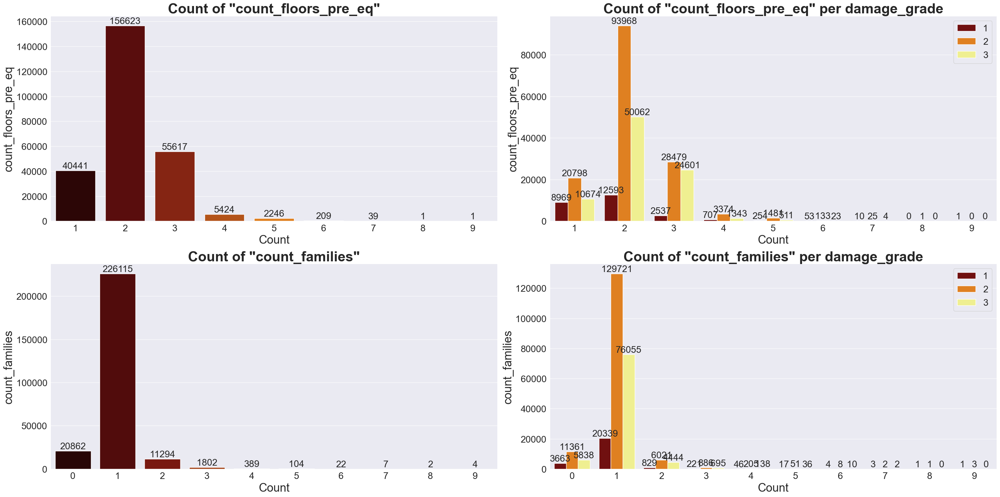

In [63]:
fig, axes = plt.subplots(2 ,2, figsize=(30, 15))
sns.set_style('darkgrid')
plotnumber = 0

for column in discrete_features:
  if plotnumber<=2:
    # loop for each subplot
    for i in range(2):
          ax= sns.countplot(data= data, x= column, palette= 'afmhot', ax= axes[plotnumber][i],
                            hue= 'damage_grade' if i == 1 else None)
          
          # title, x label, y label
          ax.set_title(f'Count of "{column}"' + (' per damage_grade' if i ==1 else ''), fontsize= 30, fontweight= 'bold')
          ax.set_xlabel('Count', fontsize= 25)
          ax.set_ylabel(column, fontsize= 25)

          # Increasing x-tick size and y-tick size
          for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontsize(20)
          for tick in ax.yaxis.get_major_ticks():
                tick.label.set_fontsize(20)
          
          # Increasing bar label size
          for container in ax.containers:
                ax.bar_label(container, fontsize= 20)
          
          # Increasing legend size
          if i ==1:
                ax.legend(fontsize= 20)
    plotnumber +=1

plt.subplots_adjust(hspace= 0.5, wspace= 0.5)
plt.tight_layout()
plt.show()

##### Insights:
**1. count_floors_pre_eq (no of floors before earthquake)**
- The buildings with ***two number of floors*** have the highest frequency followed by three-floored buidings.
- Buildings with more than 5 floors are of small in numbers.
   - The **count per damage grade** shows that in both two and three-floored buildings, medium damage is the most prevalent damage grade.
  
**2. count_families (no of families)**
- The buildings with ***one family residence*** have the highest frequency followed by 0 number of families.
- Buildings with more than 3 number of families are very small in numbers.
  - The **count per damage grade** shows that here also, ***medium damage*** is the dominant one.

##### **An overview of percentages of each unique categories in discrete features**:

In [65]:
from IPython.display import HTML

# Unique categories of all the categorical features
# Define an empty list to store HTML tables
html_output = ''

for column in discrete_features:
    # Calculate value counts and normalize
    value_counts = (data[column].value_counts(normalize=True) *100).reset_index()
    value_counts.columns = [column.upper(), 'Value_Counts']
    
    # Style DataFrame with background gradient
    styled_df = value_counts.style.format({'Value_Counts': '{:.2f}%'}).background_gradient(cmap='afmhot')
    
    # Convert styled DataFrame to HTML table
    html_table = styled_df.to_html(escape= False)
    
    # Wrap each HTML table within a <div> tag to display them separately in parallel 
    html_output += f'<div>{html_table}</div>'

# Display concatenated HTML tables
HTML(html_output)

,COUNT_FLOORS_PRE_EQ,Value_Counts
0,2,60.10%
1,3,21.34%
2,1,15.52%
3,4,2.08%
4,5,0.86%
5,6,0.08%
6,7,0.01%
7,8,0.00%
8,9,0.00%
,COUNT_FAMILIES,Value_Counts


##### **iii) OTHER CATEGORICAL FEATURES**

In [66]:
other_cat_features

['land_surface_condition',
 'foundation_type',
 'roof_type',
 'ground_floor_type',
 'other_floor_type',
 'position',
 'plan_configuration',
 'legal_ownership_status']

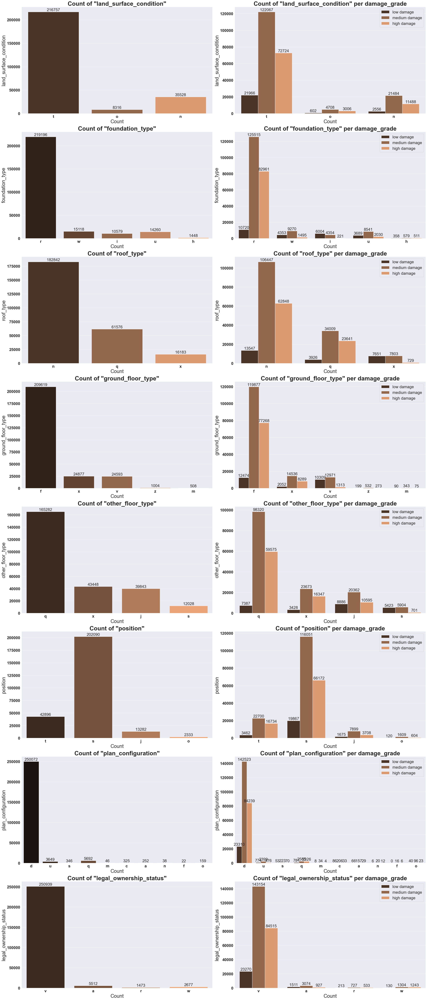

In [101]:
fig, axes = plt.subplots(8, 2, figsize=(30, 70))
sns.set_style('darkgrid')
plotnumber = 0

for column in other_cat_features:
  if plotnumber<=8:
    # loop for each subplot
    for i in range(2):
          ax= sns.countplot(data= data, x= column, palette= 'copper', ax= axes[plotnumber][i],
                            hue= 'damage_grade' if i == 1 else None)
          
          # title, x label, y label
          ax.set_title(f'Count of "{column}"' + (' per damage_grade' if i ==1 else ''), fontsize= 30, fontweight= 'bold')
          ax.set_xlabel('Count', fontsize= 25)
          ax.set_ylabel(column, fontsize= 25)

          # Increasing x-tick size and y-tick size
          for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontweight('bold')
                tick.label.set_fontsize(20)
          for tick in ax.yaxis.get_major_ticks():
                tick.label.set_fontweight('bold')
                tick.label.set_fontsize(20)
          
          # Increasing bar label size
          for container in ax.containers:
                ax.bar_label(container, fontsize= 20)
          
          # Increasing legend size
          if i ==1:
                ax.legend(['low damage', 'medium damage', 'high damage'],fontsize= 20)
    plotnumber +=1

plt.subplots_adjust(hspace= 0.5, wspace= 0.5)
plt.tight_layout()
plt.show()

##### Insights:
**1. land_surface_condition**
- The majority of buildings have a type ***t*** land surface condition, comprising around 83% of the total. 
- ***Medium damage*** is the most prevalent across both 't' and 'n' types.
  
**2. foundation_type**
- Buildings with type ***r*** foundation are the most common, accounting for approximately 84%. 
- Once again, ***medium damage*** is the most prominent damage grade.

**3. roof_type**
- The most frequent roof type is ***n***, making up about 70% of the buildings. 
- ***Medium damage*** is predominant across roof types.

**4. ground_floor_type**
- Buildings with ***f*** type ground floor are the most prevalent, constituting around 80%. 
- ***Medium damage*** is the most common damage grade.

**5. other_floor_type**
- The majority of buildings have ***q*** type other floor types, making up roughly 63%. 
- ***Medium damage*** affects the most buildings.

**6. position**
- Buildings with ***s*** type position are the most common, around 77%. 
- Once again, ***medium damage*** dominates.

**7. plan_configuration**
- The ***d*** type plan configuration is predominant, representing about 95% of buildings. 
- ***Medium damage*** is the dominant damage grade.

**8. legal_ownership_status**
- Buildings with ***v*** type legal ownership status are the most frequent, making up about 96% of the total. 
- ***Medium damage*** is prevalent across these buildings.

##### **An overview of percentages of each unique categories in other categorical features**:

In [103]:
from IPython.display import HTML

# Unique categories of all the categorical features
# Define an empty list to store HTML tables
html_output = ''

for column in other_cat_features:
    # Calculate value counts and normalize
    value_counts = (data[column].value_counts(normalize=True) *100).reset_index()
    value_counts.columns = [column.upper(), 'Value_Counts']
    
    # Style DataFrame with background gradient
    styled_df = value_counts.style.format({'Value_Counts': '{:.2f}%'}).background_gradient(cmap='afmhot')
    
    # Convert styled DataFrame to HTML table
    html_table = styled_df.to_html(escape= False)
    
    # Wrap each HTML table within a <div> tag to display them separately in parallel 
    html_output += f'<div>{html_table}</div>'

# Display concatenated HTML tables
HTML(html_output)

,LAND_SURFACE_CONDITION,Value_Counts
0,t,83.18%
1,n,13.63%
2,o,3.19%
,FOUNDATION_TYPE,Value_Counts
0,r,84.11%
1,w,5.80%
2,u,5.47%
3,i,4.06%
4,h,0.56%
,ROOF_TYPE,Value_Counts


#### **EXPLORING NUMERICAL (CONTINUOUS) FEATURES**

In [105]:
continuous_columns

['building_id',
 'geo_level_1_id',
 'geo_level_2_id',
 'geo_level_3_id',
 'age',
 'area_percentage',
 'height_percentage']

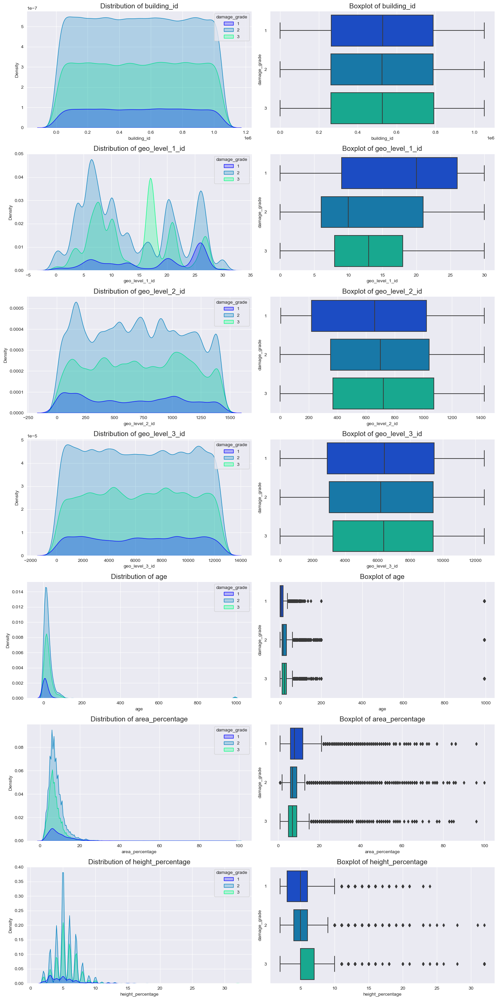

In [106]:
# Distribution plots and boxplots are plotted to show the data distribution and
# the range of majority of distribution across all the categories of damage grade.
fig, axes= plt.subplots(7, 2, figsize= (15, 30))
sns.set_style('darkgrid')

plotnum= 0
for column in continuous_columns:
  if plotnum <8:
    sns.kdeplot(data=data, x= column, hue= 'damage_grade',
                palette= 'winter', fill= True, ax= axes[plotnum][0])\
                 .set_title(f'Distribution of {column}', fontsize= '15')
    sns.boxplot(data= data, x= column, y= 'damage_grade', orient='h',
                palette= 'winter', ax= axes[plotnum][1])\
                .set_title(f'Boxplot of {column}', fontsize= '15')
    plotnum +=1
plt.tight_layout()
plt.show()

##### Insights:
**1. building_id**
- This feature is a ***unique feature*** with distinct value for each of the record hence it contributes very less to the target variable prediction.
  
**2. geo_level_1_id**
- Most of the buildings belong to 3-10 range in this level 1 geographic region.
- Buildings in this region are unevenly distributed with no meaningful pattern.
  - The **boxplot** shows that,
     - low damaged buildings shows peak value at the range of 24-28.
     - mediumly damaged buildings have the most distribution in the range of 5-9.
     - high damaged buildings oscillates in between different ranges in the distribution.

**3. geo_level_2_id**
- Most of the buildings belong to 600-850 range in this level 3 geographic region.
- Buildings in this region are evenly distributed.
  - The **boxplot** shows that all the price ranges have the same median almost equal at 750.
  - Medium damage is having more density than the rest of the damage grade type.
     
**4. geo_level_3_id**
- Most of the buildings belong to 5000-7000 range in this level 3 sub-region.
- Buildings in this region are evenly distributed.
  - The **boxplot** shows that all the price ranges have the same median hovering around 6500.
  - Medium damage is having more density than the rest of the damage grade type.

**5. age of buildings**
- The majority of buildings are 0-50 years old. 
- ***Medium damage*** affects the most buildings irrespective of the age of the buildings.
- The curve is in bell shape hence showing normal distribution.
   - The ***boxplot*** shows that 
      - there are a lot of outliers however the distribution is quite limited to less than 50 years old.

**6. area_percentage**
- Medium damage has more density than the high damage buildings.
- Most of the buildings fall in the area % range of 5-10.
  - The ***boxplot*** shows that,
     - low damaged buildings are widely distributed.

**7. height_percentage**
- Medium damage has more density than the high damage buildings.
- Most of the buildings fall in the height % range of 2-7.
  - The ***boxplot*** shows that,
     - low damaged buildings are widely distributed but there exist a lot of outliers.

##### **Visualizing how each numerical continuous independent feature contribute to each class of the target variable 'damage grade'**:

In [11]:
target= data.groupby(['damage_grade']).describe()[continuous_columns]
target.style.background_gradient(cmap='winter')

### **BIVARIATE ANALYSIS:**

#### **RELATIONSHIP BETWEEN CATEGORICAL FEATURES AND THE TARGET VARIABLE**

#### **i) BINARY FEATURES <---> TARGET VARIABLE**

In [31]:
binary_features

['has_secondary_use',
 'has_secondary_use_agriculture',
 'has_secondary_use_hotel',
 'has_secondary_use_rental',
 'has_secondary_use_institution',
 'has_secondary_use_school',
 'has_secondary_use_industry',
 'has_secondary_use_health_post',
 'has_secondary_use_gov_office',
 'has_secondary_use_use_police',
 'has_secondary_use_other',
 'has_superstructure_adobe_mud',
 'has_superstructure_mud_mortar_stone',
 'has_superstructure_stone_flag',
 'has_superstructure_cement_mortar_stone',
 'has_superstructure_mud_mortar_brick',
 'has_superstructure_cement_mortar_brick',
 'has_superstructure_timber',
 'has_superstructure_bamboo',
 'has_superstructure_rc_non_engineered',
 'has_superstructure_rc_engineered',
 'has_superstructure_other']

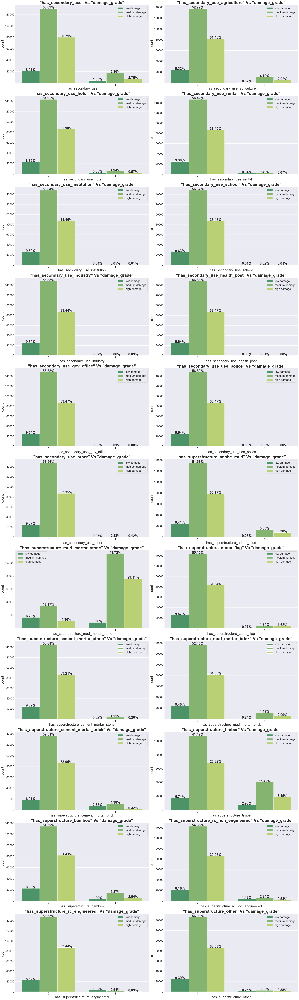

In [45]:
fig, axes = plt.subplots(11, 2, figsize=(30, 100))
sns.set_style('darkgrid')
plotnumber = 0

for column in binary_features:
    if plotnumber < 22:   
        # row and column indices of the subplot are calculated 
        ax = axes[plotnumber // 2, plotnumber % 2]
        sns.countplot(data=data, x=column, palette='summer',
                      orient='v', ax=ax, hue='damage_grade')
        
        # Title, x label, y label
        ax.set_title(f'"{column}" Vs "damage_grade"', fontsize=30, fontweight='bold')
        ax.set_xlabel(column, fontsize=25)
        ax.set_ylabel('count', fontsize=25)

        # Increasing tick label sizes
        ax.tick_params(axis='x', labelsize=20)
        ax.tick_params(axis='y', labelsize=20)
        
        # Displaying bar values in percentage rounded off to two decimal digits with '%' sign
        # calculates the total no of datapoints for % 
        total = float(len(data))

        # iterates through each patch (bar)
        for p in ax.patches:

            # get_height()--> height of the current bar
            height = p.get_height()
            # positions the text at the center of each bar 
            ax.text(p.get_x() + p.get_width() / 2., height + 5,
                    f'{height / total * 100:.2f}%', ha="center", fontsize=25, fontweight= 'bold')
        
        # Increasing legend size
        ax.legend(['low damage', 'medium damage', 'high damage'], fontsize=20)

        plotnumber += 1

plt.subplots_adjust(hspace=2, wspace=2)
plt.tight_layout()
plt.show()


##### Insights:
**1. has_secondary_use**
- In both the categories of buildings without and with the secondary usage, the average level of damage grade has the more count.
- It clearly implies that ***medium damage*** is predominant in the buildings. 

**2. has_secondary_use_agriculture**
- In both the categories of buildings without and with the secondary usage of agriculture, the average level of damage grade has the more count.
- Hence it is obvious that ***medium damage*** is prevalent in most of the buildings. 

**3. has_secondary_use_hotel**
- In both the categories of buildings without and with the secondary usage of hotel, the average level of damage grade has the more count.
- So here also ***medium damage*** is dominant in most of the buildings. 

**4. has_secondary_use_rental**
- In both the categories of buildings without and with the secondary usage of rental, the average level of damage grade has the more count.
- In those buildings that are not used for rental purpose, medium and high damage grade is the most predominant one.
- In those buildings with rental usage, medium and low damage is mostly visible however they are of very negligible size in count.
- Nevertheless ***medium damage is the more risky one*** in both of the categories.

**5. has_secondary_use_institution**
- In both the categories of buildings without and with the secondary usage of institution, the average level of damage grade has the more count.
- Therefore ***medium damage*** is dominant in most of the buildings. 

**6. has_secondary_use_school**
- In both the categories of buildings without and with the secondary usage of school, the average level of damage grade has the more count.
- Therefore ***medium damage*** is found in most of the buildings. 

**7. has_secondary_use_industry**
- In both the categories of buildings without and with the secondary usage of industry, the average level of damage grade has the more count.
- Hence ***medium damage*** is the crucial one in most of the buildings. 

**8. has_secondary_use_health_post**
- In both the categories of buildings without and with the secondary usage of health_post, the average level of damage grade has the more count.
- Hence ***medium damage*** is the significant one in most of the buildings. 

**9. has_secondary_use_gov_office**
- In both the categories of buildings without and with the secondary usage of government office, the average level of damage grade has the more count.
- Hence ***medium damage*** is the significant one in most of the buildings. 

**10. has_secondary_use_use_police**
- In both the categories of buildings without and with the secondary usage of police, the average level of damage grade has the more count.
- Hence ***medium damage*** is the dominant damage grade in most of the buildings. 

**11. has_secondary_use_other**
- In both the categories of buildings without and with the secondary usage of other purposes, the average level of damage grade has the more count.
- Hence ***medium damage*** is the dominant damage grade in most of the buildings. 

**12. has_superstructure_adobe_mud**
- In both the categories of buildings without and with the superstructure of adobe mud, the average level of damage grade has the more count followed by high level of damage
- Hence ***medium damage*** affects the most in both types of the buidings.
- This implies this type of superstructure is not significant in contributing to the resilience of the buildings. 

**13. has_superstructure_mud_mortar_stone**
- Both the categories of buildings without and with the superstructure of mud mortar stone, the average level of damage grade has the more count followed by high level of damage.
- Hence ***medium damage*** affects the most in both types of the buidings.

**14. has_superstructure_stone_flag**
- Both the categories of buildings without and with the superstructure of stone flag, the average level of damage grade has the more count.
- However without the stone flag superstructure, medium and high damage is more prevalent whereas with stone flag superstructure, medium and high damage is of almost equal density in the buildings.

**15. has_superstructure_cement_mortar_stone**
- Both the categories of buildings without and with the superstructure of cement mortar stone, the average level of damage grade has the more count.
- However with the cement mortar stone superstructure, only average damage is more and there is only negligible amount of  high level of damage.
- Hence ***cement mortar stone superstructure could reduce the high level damage*** significantly.

**16. has_superstructure_mud_mortar_brick**
- Both the categories of buildings without and with the superstructure of mud mortar brick, the average level of damage grade has the more count.
- Hence ***medium damage*** is predominant.

**17. has_superstructure_cement_mortar_brick**
- Both the categories of buildings without and with the superstructure of cement mortar brick, the average level of damage grade has the more count.
- However with the cement mortar brick superstructure, only average damage is more followed by low damage.
- Hence ***cement mortar brick superstructure contributes well in reducing the heavy damage*** in the buildings.

**18. has_superstructure_timber**
- Both the categories of buildings without and with the superstructure of timber, the average level of damage grade has the more count.
- Therefore ***medium damage grade is the most prevalent one*** in most of the buildings.

**19. has_superstructure_bamboo**
- Both the categories of buildings without and with the superstructure of bamboo, the average level of damage grade has the more count.
- Hence, here also ***medium damage grade is the most prevalent one*** in most of the buildings.

**20. has_superstructure_rc_non_engineered**
- Both the categories of buildings without and with the superstructure of non-engineered reinforced concrete, the average level of damage grade has the more count.
- However with the non-engineered reinforced concrete superstructure, only average and low level of damage are seen in most of the buildings.
- Hence ***non-engineered reinforced concrete plays a great role in reducing the heavy damage*** in the buildings.

**21. has_superstructure_rc_engineered**
- Among the buildings with the engineered reinforced concrete, the medium damage is the most prevalent one followed by the high damage.
- However ***with the engineered reinforced concrete superstructure***, the ***low damage grade is dominant*** followed by only average level of damage. 
- Hence ***engineered reinforced concrete superstructure significantly reduces the damage*** in the buildings.

**22. has_superstructure_other**
- Both the categories of buildings without and with the superstructure of other types, the average level of damage grade has the more count.
- Hence here, ***medium damage grade is the most prevalent one*** in most of the buildings.

**SUMMARY INSIGHTS**
- **Medium damage grade emerges as the most prevalent** across various building characteristics, underscoring its significance as a common outcome in earthquake events.

- Materials like **cement mortar stone, cement mortar brick, non-engineered reinforced concrete, and engineered reinforced concrete** exhibit **better resilience**, showing a trend towards lower levels of damage compared to other materials.

- The dataset suggests a **consistent pattern** where buildings, regardless of their characteristics, tend to experience medium damage more frequently than low or high damage grades.

#### **ii) DISCRETE FEATURES <---> TARGET VARIABLE**

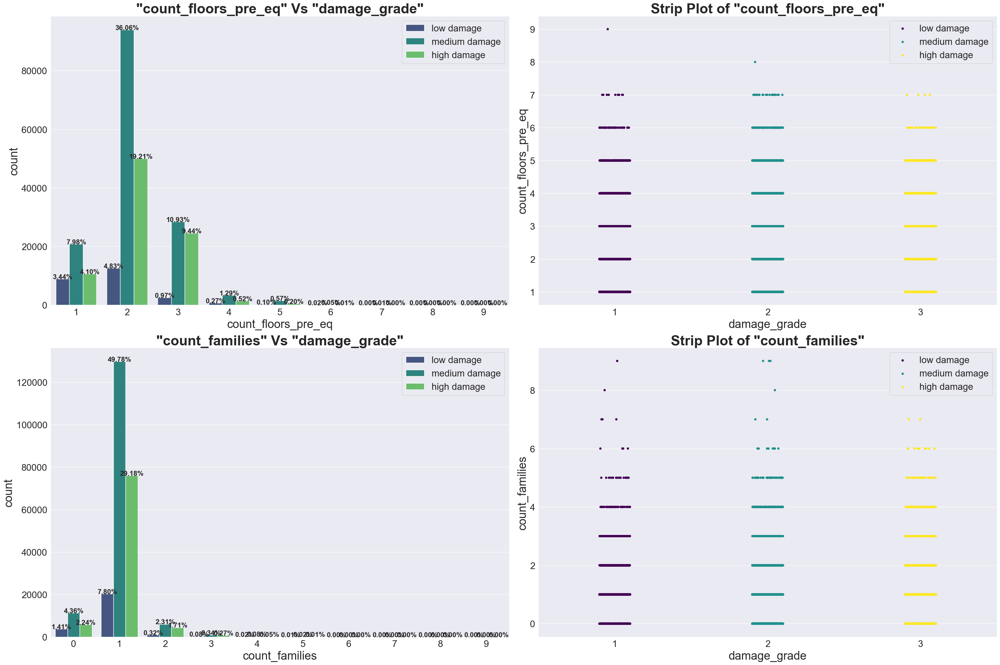

In [90]:
fig, axes = plt.subplots(2, 2, figsize=(30, 20))
sns.set_style('darkgrid')
plotnumber = 0

for column in discrete_features:
    if plotnumber <= 2:
        # Accessing subplot based on plot number
        for i in range(2):
            ax = axes[plotnumber][i]

            # Generating countplot in the first column
            if i == 0:
                sns.countplot(data=data, x=column, palette='viridis', ax=ax, hue='damage_grade')
                
                # title, x label, y label
                ax.set_title(f'"{column}" Vs "damage_grade"', fontsize=30, fontweight='bold')
                ax.set_xlabel(column, fontsize=25)
                ax.set_ylabel('count', fontsize=25)

                # xticks, y ticks, legend
                ax.tick_params(axis='x', labelsize=20)
                ax.tick_params(axis='y', labelsize=20)
                ax.legend(['low damage', 'medium damage', 'high damage'], fontsize=20)

                # Displaying bar values in percentage rounded off to two decimal digits with '%' sign
                # calculates the total no of datapoints for % 
                total = float(len(data))

                # iterates through each patch (bar)
                for p in ax.patches:
                    # get_height()--> height of the current bar
                    height = p.get_height()
                    # positions the text at the center of each bar 
                    ax.text(p.get_x() + p.get_width() / 2., height + 5,
                    f'{height / total * 100:.2f}%', ha="center", fontsize=15, fontweight= 'bold')
                    
                    
            # Generating strip plot in the second column
            else:
                sns.stripplot(data=data, x='damage_grade', y=column, ax=ax, palette='viridis', hue='damage_grade')
                ax.set_title(f'Strip Plot of "{column}"', fontsize=30, fontweight= 'bold')
                ax.set_xlabel('damage_grade', fontsize=25)
                ax.set_ylabel(column, fontsize=25)
                ax.tick_params(axis='x', labelsize=20)
                ax.tick_params(axis='y', labelsize=20)
                ax.legend(['low damage', 'medium damage', 'high damage'],fontsize=20)
        plotnumber += 1

plt.subplots_adjust(hspace=0, wspace=0.5)
plt.tight_layout()
plt.show()


##### Insights:
**1. count_floors_pre_eq (no of floors before earthquake)**
- ***Two-floored and three-floored buildings*** have the highest count among other floored buildings.
- ***Medium damage*** is the most prevalent damage grade in these buildings.
- Around ***36% of buildings are the 2-floored buildings with medium damage grade*** in the dataset.
- As per the strip plot, most of the buidings are with a maximum of 5-6 floors and buildings >6 floors are very less compared to other buildings.

  
**2. count_families (no of families)**
- Buildings with 0 or 1 no of families are the majority compared to other buildings.
- Around ***50% of buildings are those with 1 family residence which suffered medium damage*** due to earthquake.
- ***Medium damage*** is the most prevalent damage grade in these buildings..
- As per the strip plot, most of the buidings are with a number of families of maximum of 0-5.


#### **iii) OTHER CATEGORICAL FEATURES <---> TARGET VARIABLE**

In [91]:
other_cat_features

['land_surface_condition',
 'foundation_type',
 'roof_type',
 'ground_floor_type',
 'other_floor_type',
 'position',
 'plan_configuration',
 'legal_ownership_status']

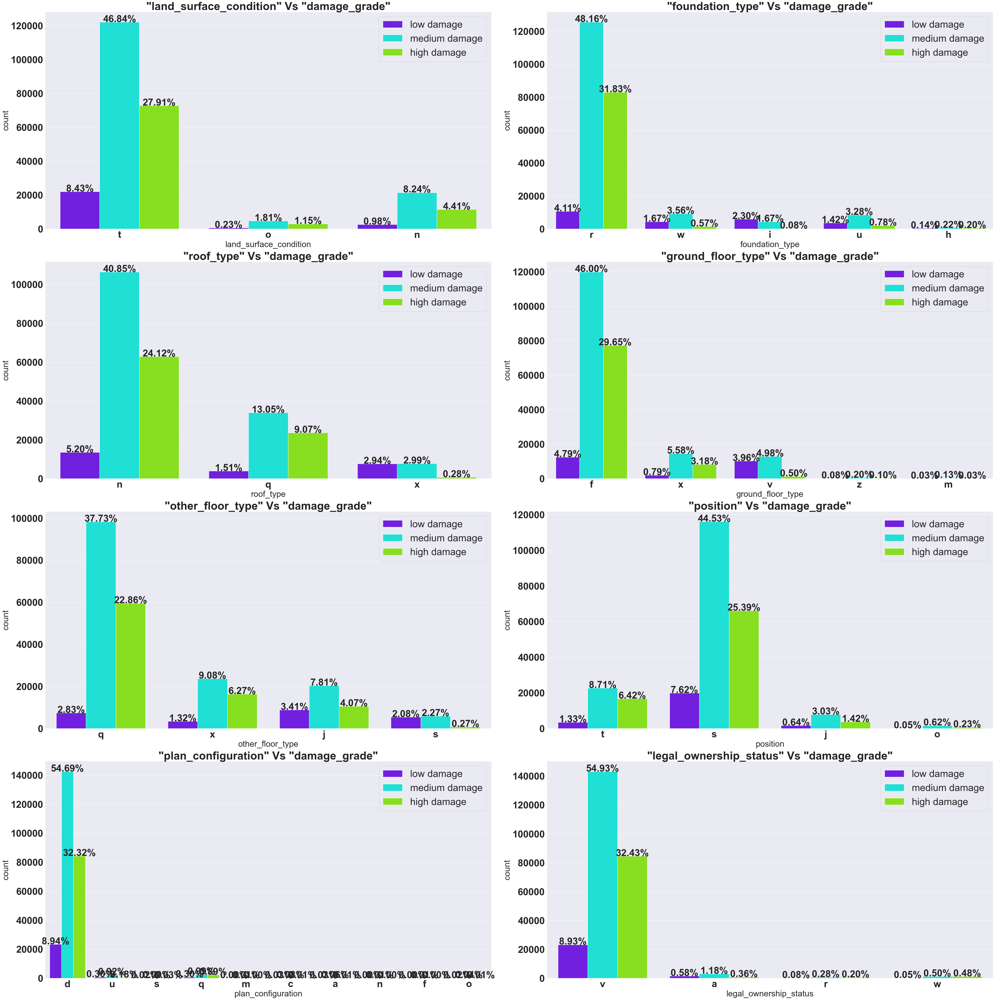

In [30]:
fig, axes = plt.subplots(4, 2, figsize=(50, 50))
sns.set_style('darkgrid')
plotnumber = 0

for column in other_cat_features:
    if plotnumber < 8:   
        # row and column indices of the subplot are calculated 
        ax = axes[plotnumber // 2, plotnumber % 2]
        sns.countplot(data=data, x=column, palette='hsv_r',
                      orient='v', ax=ax, hue='damage_grade')
        
        # Title, x label, y label
        ax.set_title(f'"{column}" Vs "damage_grade"', fontsize=40, fontweight='bold')
        ax.set_xlabel(column, fontsize=30)
        ax.set_ylabel('count', fontsize=30)
        
        # Increasing x-tick size and y-tick size
        for tick in ax.xaxis.get_major_ticks():
                tick.label.set_fontweight('bold')
                tick.label.set_fontsize(35)
        for tick in ax.yaxis.get_major_ticks():
                tick.label.set_fontweight('bold')
                tick.label.set_fontsize(35)
        
        # Displaying bar values in percentage rounded off to two decimal digits with '%' sign
        # calculates the total no of datapoints for % 
        total = float(len(data))

        # iterates through each patch (bar)
        for p in ax.patches:

            # get_height()--> height of the current bar
            height = p.get_height()
            # positions the text at the center of each bar 
            ax.text(p.get_x() + p.get_width() / 2., height + 5,
                    f'{height / total * 100:.2f}%', ha="center", fontsize=35, fontweight= 'bold')
        
        # Increasing legend size
        ax.legend(['low damage', 'medium damage', 'high damage'], fontsize=35)

        plotnumber += 1

plt.subplots_adjust(hspace=2, wspace=2)
plt.tight_layout()
plt.show()


##### Insights:
**1. land_surface_condition**
- The majority of buildings have a type ***t*** land surface condition, comprising around 83% of the total. 
- ***Medium damage*** is the most dominant damage grade in these buildings.
- Around ***47% of buildings have "t" of land surface condition with medium damage grade*** due to earthquake.

  
**2. foundation_type**
- Buildings with type ***r*** foundation are the most common, accounting for approximately 84%. 
- Once again, ***medium damage*** is the most prominent damage grade.
- ***Around 48% of buildings have r type of foundation with medium damage grade*** out of all buildings.

**3. roof_type**
- The most frequent roof type is ***n***, making up about 70% of the buildings. 
- ***Medium damage*** is predominant across roof types.
- ***Around 41% of buildings have "n" type of roof with medium damage grade*** of earthquake.

**4. ground_floor_type**
- Buildings with ***f*** type ground floor are the most prevalent, constituting around 80%. 
- ***Medium damage*** is the most common damage grade.
- Again ***46% of buildings belong to "f" type of ground floor with medium damage grade*** in the buildings.

**5. other_floor_type**
- The majority of buildings have ***q*** type other floor types, making up roughly 63%. 
- ***Medium damage*** affects the most buildings.
- ***q type of other floor categoried buildings of medium damage grade constitute around 38%*** of total buildings.

**6. position**
- Buildings with ***s*** type position are the most common, around 77%. 
- Once again, ***medium damage*** dominates.
- Around ***45% of buildings is of "s" type of position with medium damage effects***.

**7. plan_configuration**
- The ***d*** type plan configuration is predominant, representing about 95% of buildings out of which ***55%*** of buildings suffer from medium damage and it's consequences.
- ***Medium damage*** is the dominant damage grade.

**8. legal_ownership_status**
- Buildings with ***v*** type legal ownership status are the most frequent, making up about 96% of the total. 
- ***Medium damage*** is prevalent across these buildings.

#### **RELATIONSHIP BETWEEN NUMERICAL (CONTINUOUS) FEATURES AND THE TARGET VARIABLE**

In [32]:
continuous_columns

['building_id',
 'geo_level_1_id',
 'geo_level_2_id',
 'geo_level_3_id',
 'age',
 'area_percentage',
 'height_percentage']

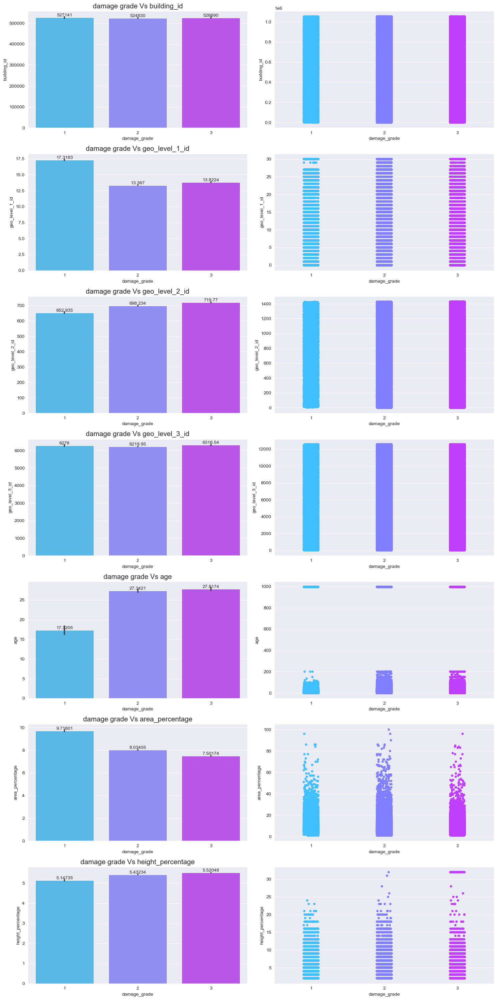

In [17]:
# Bar plots and swarm plots are plotted to visualize the relationship between the
# continuous input features and the target variable

fig, axes= plt.subplots(7,2, figsize= (15, 30))
sns.set_style('darkgrid')
idx=0

for column in continuous_columns:
  if idx <8:
       sns.barplot(data=data, x='damage_grade', y= column, palette='cool', ax= axes[idx][0])\
       .set_title(f'damage grade Vs {column}', fontsize= '15')

       for container in axes[idx][0].containers:
           axes[idx][0].bar_label(container)

       sns.stripplot(data=data, x= 'damage_grade', y= column, palette='cool', ax= axes[idx][1])

  idx+=1
plt.tight_layout()
plt.show()

##### Insights:
**1. building_id**
- This feature is a ***unique feature*** with distinct value for each of the record hence it contributes very less to the target variable prediction.
  
**2. geo_level_1_id**
- Most of the buildings belong to 3-10 range in this level 1 geographic region.
- Low damage is highly prevalent than other types of damage grade. 

**3. geo_level_2_id**
- Most of the buildings belong to 600-850 range in this level 3 geographic region.
- Buildings in this region are evenly distributed.
- High damage grade is slightly higher than the rest of the damage grades.
     
**4. geo_level_3_id**
- Most of the buildings belong to 5000-7000 range in this level 3 sub-region.
- Buildings in this region are evenly distributed.
- All the three levels of damage are almost same here.

**5. age of buildings**
- The majority of buildings are 0-50 years old. 
- As the age increases, the damage due to earthquake also increases.
- However the medium damage is the most prevalent one here. 

**6. area_percentage**
- Medium damage has more density than the high damage buildings.
- Most of the buildings fall in the area % range of 5-10.
- However low damaged buildings are widely distributed and mostly covered high are perentaged buildings.

**7. height_percentage**
- Medium damage has more density than the high damage buildings.
- Most of the buildings fall in the height % range of 2-7.
- low damaged buildings are widely distributed but there exist a lot of outliers.

### **MULTIVARIATE ANALYSIS:**

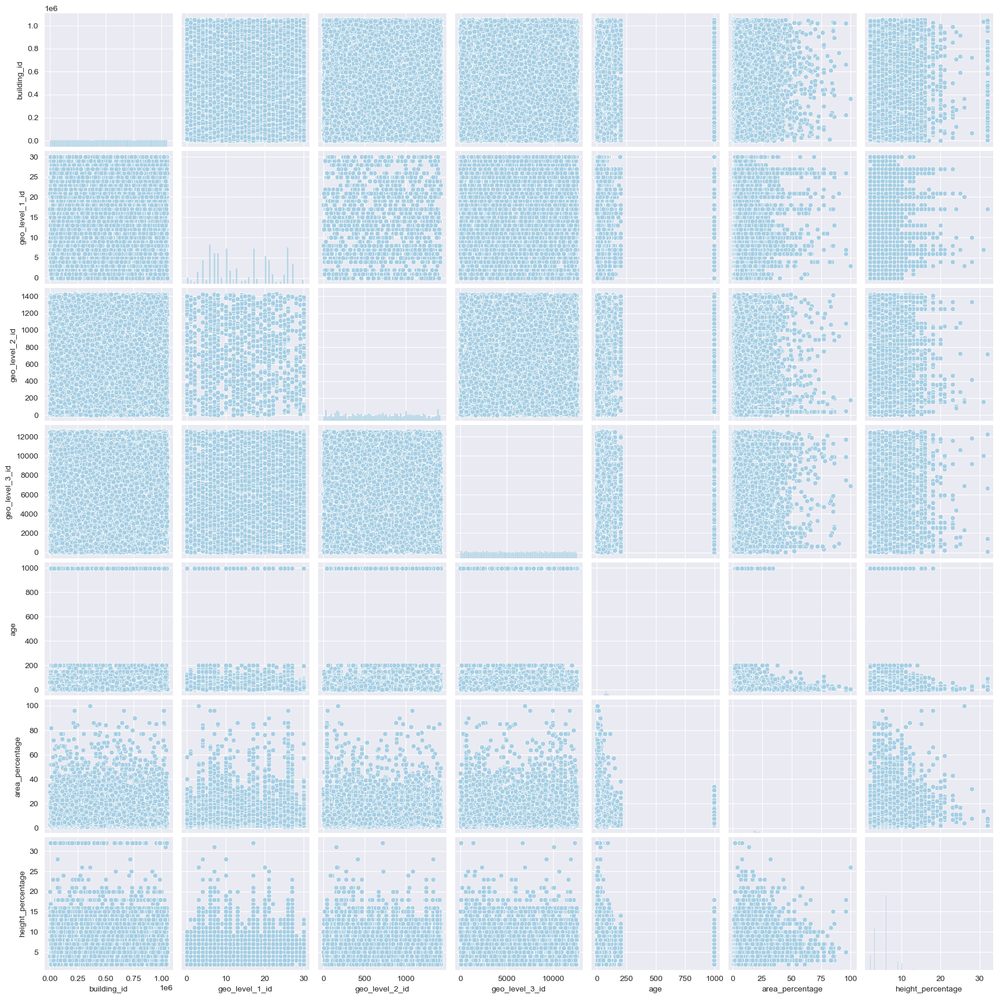

In [47]:
sns.color_palette(palette='Paired')
sns.pairplot(data= data.loc[:, continuous_columns])
plt.show()

##### Insights:
1. The scatter plot highlights a notable trend: older buildings tend to have lower area and height percentages compared to newer ones.

2. It's evident that there are numerous outliers in the age column, suggesting potential data anomalies.

3. The majority of buildings fall into the category of those with smaller area percentages.

4. Although there appears to be an inverse relationship between height and area percentages, the presence of outliers requires preprocessing for clearer conclusions.

5. When examining the distribution of other features, no clear trends emerge; the data remains randomly scattered.

## **DATA PREPROCESSING:**

### **CHECKING NULL VALUES:**

In [31]:
data.isnull().sum()

building_id                               0
geo_level_1_id                            0
geo_level_2_id                            0
geo_level_3_id                            0
count_floors_pre_eq                       0
age                                       0
area_percentage                           0
height_percentage                         0
land_surface_condition                    0
foundation_type                           0
roof_type                                 0
ground_floor_type                         0
other_floor_type                          0
position                                  0
plan_configuration                        0
has_superstructure_adobe_mud              0
has_superstructure_mud_mortar_stone       0
has_superstructure_stone_flag             0
has_superstructure_cement_mortar_stone    0
has_superstructure_mud_mortar_brick       0
has_superstructure_cement_mortar_brick    0
has_superstructure_timber                 0
has_superstructure_bamboo       

##### Insights:
- There are no null values in any of the records of the data.

### **CHECKING FOR DUPLICATE RECORDS:**

In [33]:
data.duplicated().sum()

0

##### Insights:
- There are no duplicate records found.

### **ENCODING:**

In [43]:
# features to be encoded
other_cat_features

['land_surface_condition',
 'foundation_type',
 'roof_type',
 'ground_floor_type',
 'other_floor_type',
 'position',
 'plan_configuration',
 'legal_ownership_status']

#### ***i) land_surface_condition***

In [44]:
# label encoding is being done here

data.land_surface_condition.value_counts()


land_surface_condition
t    216757
n     35528
o      8316
Name: count, dtype: int64

In [48]:
from sklearn.preprocessing import LabelEncoder
label= LabelEncoder()

data['land_surface_condition'] = label.fit_transform(data['land_surface_condition'])

In [50]:
data[['land_surface_condition']].value_counts()

land_surface_condition
2                         216757
0                          35528
1                           8316
Name: count, dtype: int64

#### ***ii) foundation_type***

In [51]:
data.foundation_type.value_counts()

foundation_type
r    219196
w     15118
u     14260
i     10579
h      1448
Name: count, dtype: int64

In [52]:
data['foundation_type'] = label.fit_transform(data['foundation_type'])

In [53]:
data.foundation_type.value_counts()

foundation_type
2    219196
4     15118
3     14260
1     10579
0      1448
Name: count, dtype: int64

#### ***iii) roof_type***

In [54]:
data.roof_type.value_counts()

roof_type
n    182842
q     61576
x     16183
Name: count, dtype: int64

In [55]:
data['roof_type'] = label.fit_transform(data['roof_type'])

In [56]:
data.roof_type.value_counts()

roof_type
0    182842
1     61576
2     16183
Name: count, dtype: int64

#### ***iv) ground_floor_type***

In [57]:
data.ground_floor_type.value_counts()

ground_floor_type
f    209619
x     24877
v     24593
z      1004
m       508
Name: count, dtype: int64

In [58]:
data['ground_floor_type'] = label.fit_transform(data['ground_floor_type'])

In [59]:
data.ground_floor_type.value_counts()

ground_floor_type
0    209619
3     24877
2     24593
4      1004
1       508
Name: count, dtype: int64

#### ***v) other_floor_type***

In [60]:
data.other_floor_type.value_counts()

other_floor_type
q    165282
x     43448
j     39843
s     12028
Name: count, dtype: int64

In [61]:
data['other_floor_type'] = label.fit_transform(data['other_floor_type'])

In [62]:
data.other_floor_type.value_counts()

other_floor_type
1    165282
3     43448
0     39843
2     12028
Name: count, dtype: int64

#### ***vi) position***

In [63]:
data.position.value_counts()

position
s    202090
t     42896
j     13282
o      2333
Name: count, dtype: int64

In [64]:
data['position'] = label.fit_transform(data['position'])

In [65]:
data.position.value_counts()

position
2    202090
3     42896
0     13282
1      2333
Name: count, dtype: int64

#### ***vii) plan_configuration***

In [66]:
data.plan_configuration.value_counts()

plan_configuration
d    250072
q      5692
u      3649
s       346
c       325
a       252
o       159
m        46
n        38
f        22
Name: count, dtype: int64

In [67]:
data['plan_configuration'] = label.fit_transform(data['plan_configuration'])

In [68]:
data.plan_configuration.value_counts()

plan_configuration
2    250072
7      5692
9      3649
8       346
1       325
0       252
6       159
4        46
5        38
3        22
Name: count, dtype: int64

#### ***viii) legal_ownership_status***

In [69]:
data.legal_ownership_status.value_counts()

legal_ownership_status
v    250939
a      5512
w      2677
r      1473
Name: count, dtype: int64

In [70]:
data['legal_ownership_status'] = label.fit_transform(data['legal_ownership_status'])

In [71]:
data.legal_ownership_status.value_counts()

legal_ownership_status
2    250939
0      5512
3      2677
1      1473
Name: count, dtype: int64

In [73]:
# checking the encoded features

data[['land_surface_condition',
 'foundation_type',
 'roof_type',
 'ground_floor_type',
 'other_floor_type',
 'position',
 'plan_configuration',
 'legal_ownership_status']]

,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,legal_ownership_status
0,2,2,0,0,1,3,2,2
1,1,2,0,3,1,2,2,2
2,2,2,0,0,3,3,2,2
3,2,2,0,0,3,2,2,2
4,2,2,0,0,3,2,2,2
...,...,...,...,...,...,...,...,...
260596,0,2,0,0,0,2,7,2
260597,2,2,0,0,1,2,2,2
260598,2,2,1,0,1,2,2,2
260599,2,2,2,2,2,0,2,2


### **CHECKING FOR OUTLIERS:**

In [74]:
# numerical features
continuous_columns

['building_id',
 'geo_level_1_id',
 'geo_level_2_id',
 'geo_level_3_id',
 'age',
 'area_percentage',
 'height_percentage']

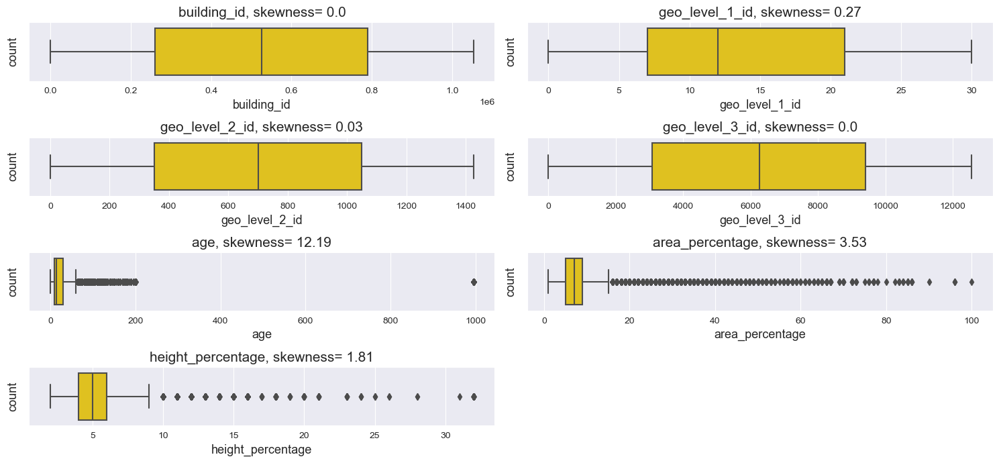

In [77]:
# visualizing the continuous columns through boxplot to check the presence of outliers

plt.figure(figsize= (15, 7))
sns.set_style('darkgrid')
plotnumber=1

for column in continuous_columns:
  if plotnumber <8:
    ax= plt.subplot(4, 2, plotnumber)
    sns.boxplot(data= data, x=column, color= 'gold', orient='h')
    ax.set_title(f'{column}, skewness= {round(data[column].skew(),2)}', fontsize= 15)
    plt.xlabel(column, fontsize= 13)
    plt.ylabel('count', fontsize= 13)
  plotnumber+=1
plt.tight_layout()
plt.show()

From the boxplot, it is clear that the features such as **age, area_percentage and height_percentage** are showing the outliers.

#### **Detecting outliers**

In [92]:
# Detecting outliers
# by IQR method

num_columns= data[['building_id',
 'geo_level_1_id',
 'geo_level_2_id',
 'geo_level_3_id',
 'age',
 'area_percentage',
 'height_percentage']]
q1= num_columns.quantile(0.25)
q3= num_columns.quantile(0.75)
iqr= q3 - q1

lower_limit= q1 - 1.5*iqr
upper_limit= q3 + 1.5*iqr

# Identifying outliers
outliers= ((num_columns < lower_limit)|(num_columns > upper_limit))

# total number of outliers for each variable
total_count_outliers= outliers.sum()

total_count_outliers.to_frame().T.style.background_gradient(cmap= 'YlGn')

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,age,area_percentage,height_percentage
0,0,0,0,0,12499,13557,7843


#### **Handling outliers**

##### ***i) age***

In [95]:
# skewed distribution so IQR METHOD

q1= data['age'].quantile(0.25)
q3= data['age'].quantile(0.75)
iqr= q3 -q1
lower_limit = q1- 1.5*iqr
upper_limit = q3+ 1.5*iqr
print('lower limit is', lower_limit)
print('upper limit is', upper_limit)

lower limit is -20.0
upper limit is 60.0


In [96]:
len(data.loc[(data['age'] < lower_limit)|(data['age']> upper_limit)])/len(data) *100

4.796221042896995

#### Insights:
Since outliers in age column are less than 5%, they can be handled without harming the underlying pattern.

In [97]:
data.loc[data['age'] < lower_limit]

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade


In [102]:
data.loc[data['age']> upper_limit, 'age']

24         80
42         70
90         70
124        65
216       100
         ... 
260480     80
260541    100
260542    995
260551     70
260579    995
Name: age, Length: 12499, dtype: int64

In [103]:
# handling outliers
data.loc[data['age']> upper_limit, 'age']= np.median(data['age'])

In [104]:
# checking the outliers handled column
data.loc[data['age']> upper_limit, 'age']

Series([], Name: age, dtype: int64)

##### ***ii) area percentage***

In [105]:
# skewed distribution so IQR METHOD

q1= data['area_percentage'].quantile(0.25)
q3= data['area_percentage'].quantile(0.75)
iqr= q3 -q1
lower_limit = q1- 1.5*iqr
upper_limit = q3+ 1.5*iqr
print('lower limit is', lower_limit)
print('upper limit is', upper_limit)

lower limit is -1.0
upper limit is 15.0


In [106]:
len(data.loc[(data['area_percentage'] < lower_limit)|(data['area_percentage']> upper_limit)])/len(data) *100

5.202205670738024

##### Insights:
- Here area percentage has **outliers greater than 5%** hence handling them might potentially harm the meaningful information within the dataset. Hence **scaling can be done** to deal with it.

##### ***iii) height percentage***

In [107]:
# skewed distribution so IQR METHOD

q1= data['height_percentage'].quantile(0.25)
q3= data['height_percentage'].quantile(0.75)
iqr= q3 -q1
lower_limit = q1- 1.5*iqr
upper_limit = q3+ 1.5*iqr
print('lower limit is', lower_limit)
print('upper limit is', upper_limit)

lower limit is 1.0
upper limit is 9.0


In [108]:
len(data.loc[(data['height_percentage'] < lower_limit)|(data['height_percentage']> upper_limit)])/len(data) *100

3.0095816976911065

##### Insights:
- Outliers are less than 5%, hence handling them would be the better option.

In [110]:
data.loc[data['height_percentage'] < lower_limit]

,building_id,geo_level_1_id,geo_level_2_id,geo_level_3_id,count_floors_pre_eq,age,area_percentage,height_percentage,land_surface_condition,foundation_type,roof_type,ground_floor_type,other_floor_type,position,plan_configuration,has_superstructure_adobe_mud,has_superstructure_mud_mortar_stone,has_superstructure_stone_flag,has_superstructure_cement_mortar_stone,has_superstructure_mud_mortar_brick,has_superstructure_cement_mortar_brick,has_superstructure_timber,has_superstructure_bamboo,has_superstructure_rc_non_engineered,has_superstructure_rc_engineered,has_superstructure_other,legal_ownership_status,count_families,has_secondary_use,has_secondary_use_agriculture,has_secondary_use_hotel,has_secondary_use_rental,has_secondary_use_institution,has_secondary_use_school,has_secondary_use_industry,has_secondary_use_health_post,has_secondary_use_gov_office,has_secondary_use_use_police,has_secondary_use_other,damage_grade


In [112]:
data.loc[data['height_percentage'] > upper_limit, 'height_percentage']

29        10
113       10
120       10
144       10
187       32
          ..
260480    10
260492    10
260545    10
260589    11
260594    12
Name: height_percentage, Length: 7843, dtype: int64

In [113]:
# handling outliers
data.loc[data['height_percentage']> upper_limit, 'height_percentage']= np.median(data['height_percentage'])

In [114]:
# checking the column after handling the outliers
data.loc[data['height_percentage'] > upper_limit, 'height_percentage']

Series([], Name: height_percentage, dtype: int64)

In [ ]:
# hence outliers are handled.

### **SCALING:**